## **Environmental Setup**

In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.stats as stat
import pylab 
import math

from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error as mse, make_scorer

import warnings
warnings.filterwarnings('ignore')

## **Data Dictionary**

<img src="img/data_dict.png" style="width:800px;height:500px;">

## **DataSet Import**

In [134]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
df = pd.concat([train_df, test_df], ignore_index= True)

In [135]:
df.head()

,trip_distance,rate_code,store_and_fwd_flag,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,imp_surcharge,total_amount,pickup_location_id,dropoff_location_id,year,month,day,day_of_week,hour_of_day,trip_duration,calculated_total_amount
0,9.01,1,N,1,26.0,0.0,0.5,8.14,5.76,0.3,40.70,262,138,2018,3,7,2,6,2131.0,24.30
1,0.20,1,N,1,3.0,0.0,0.5,0.75,0.00,0.3,4.55,263,236,2018,2,25,6,10,2377.0,37.40
2,9.65,1,N,1,41.5,0.0,0.5,9.61,5.76,0.3,57.67,138,230,2018,1,29,0,8,1286.0,30.36
3,9.50,1,N,1,30.0,0.5,0.5,9.25,5.76,0.3,46.31,186,138,2018,9,25,1,20,2586.0,4.30
4,5.80,1,N,1,21.5,0.5,0.5,4.56,0.00,0.3,27.36,162,87,2018,8,20,0,21,1575.0,23.80


## **Initial Analysis**

In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   trip_distance            50000 non-null  float64
 1   rate_code                50000 non-null  int64  
 2   store_and_fwd_flag       50000 non-null  object 
 3   payment_type             50000 non-null  int64  
 4   fare_amount              50000 non-null  float64
 5   extra                    50000 non-null  float64
 6   mta_tax                  50000 non-null  float64
 7   tip_amount               50000 non-null  float64
 8   tolls_amount             50000 non-null  float64
 9   imp_surcharge            50000 non-null  float64
 10  total_amount             50000 non-null  float64
 11  pickup_location_id       50000 non-null  int64  
 12  dropoff_location_id      50000 non-null  int64  
 13  year                     50000 non-null  int64  
 14  month                 

In [137]:
df.duplicated().sum()

0

In [138]:
df.describe()

,trip_distance,rate_code,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,imp_surcharge,total_amount,pickup_location_id,dropoff_location_id,year,month,day,day_of_week,hour_of_day,trip_duration,calculated_total_amount
count,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.0,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,35000.000000
mean,9.093300,1.10710,1.123720,31.896397,0.320838,0.486960,6.144731,2.259124,0.299934,41.417478,152.45250,146.482140,2018.0,6.12992,15.309240,2.882520,13.814780,2250.550020,41.324249
std,4.491785,0.57243,0.350051,14.632630,0.407761,0.079687,4.436417,3.537413,0.004449,19.232173,59.71437,76.368319,0.0,3.33669,8.685061,1.925064,6.222891,5033.290248,19.167043
min,0.010000,1.00000,1.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.310000,1.00000,1.000000,2018.0,1.00000,1.000000,0.000000,0.000000,1.000000,0.310000
25%,6.490000,1.00000,1.000000,24.000000,0.000000,0.500000,4.460000,0.000000,0.300000,30.350000,132.00000,87.000000,2018.0,3.00000,7.000000,1.000000,10.000000,1452.000000,30.300000
50%,8.710000,1.00000,1.000000,29.000000,0.000000,0.500000,6.050000,0.000000,0.300000,38.470000,138.00000,141.000000,2018.0,6.00000,16.000000,3.000000,14.000000,1863.000000,38.460000
75%,10.972500,1.00000,1.000000,36.000000,0.500000,0.500000,8.080000,5.760000,0.300000,48.300000,186.00000,228.000000,2018.0,9.00000,23.000000,4.000000,19.000000,2345.000000,48.200000
max,79.010000,5.00000,4.000000,400.000000,18.500000,0.500000,215.000000,189.500000,0.300000,468.350000,265.00000,265.000000,2018.0,12.00000,31.000000,6.000000,23.000000,86347.000000,468.350000


Summary:
* There are no NULL values.
* There are no duplicate rows.
    

## **Variable Identification and Typecating**

In [139]:
df.dtypes[(df.dtypes == 'float64') | (df.dtypes == 'int64')]

trip_distance              float64
rate_code                    int64
payment_type                 int64
fare_amount                float64
extra                      float64
mta_tax                    float64
tip_amount                 float64
tolls_amount               float64
imp_surcharge              float64
total_amount               float64
pickup_location_id           int64
dropoff_location_id          int64
year                         int64
month                        int64
day                          int64
day_of_week                  int64
hour_of_day                  int64
trip_duration              float64
calculated_total_amount    float64
dtype: object

The following attributes belong to **category** datatype:
* rate_code
* payment_type
* pickup_location_id
* dropoff_location_id


In [140]:
for attr in ['rate_code', 'store_and_fwd_flag','payment_type', 'pickup_location_id', 'dropoff_location_id']:
    df[attr] = df[attr].astype('category')

## **EDA & Feature Engineering**

### **Introducing new features**

In [141]:
df['tax_amount'] = df['mta_tax'] + df['tolls_amount']

#Dropping below attributes as they will not participate well in model building.
df = df.drop(['imp_surcharge','year', 'mta_tax', 'tolls_amount'], axis = 1)

In [142]:
# custom function for easy and efficient analysis of numerical variables
def UVA_numeric(data, var, target):
  '''
  Numerical univariate Analysis
  takes a group of variables (INTEGER and FLOAT) and plot/print all the descriptives and properties along with KDE.

  Runs a loop: calculate all the descriptives of i(th) variable and plot/print it
  '''

  plt.figure(figsize = (13,3), dpi = 100)
    
  # calculating descriptives of variable
  mini = data[var].min()
  maxi = data[var].max()
  ran = data[var].max()-data[var].min()
  mean = data[var].mean()
  median = data[var].median()
  st_dev = data[var].std()
  skew = data[var].skew()
  kurt = data[var].kurtosis()
  corr = data[[var, target]].corr().iloc[0,1]
  # calculating points of standard deviation
  points = mean-st_dev, mean+st_dev

  #Plotting the variable with every information
  plt.subplot(1,3,1)
  sns.kdeplot(data[var], shade=True)
  sns.lineplot(points, [0,0], color = 'black', label = "std_dev")
  sns.scatterplot([mini,maxi], [0,0], color = 'orange', label = "min/max")
  sns.scatterplot([mean], [0], color = 'red', label = "mean")
  sns.scatterplot([median], [0], color = 'blue', label = "median")
  plt.xlabel('{}'.format(var), fontsize = 20)
  plt.ylabel('density')
  plt.title('std_dev = {}; kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format((round(points[0],2),round(points[1],2)),
                                                                                                   round(kurt,2),
                                                                                                   round(skew,2),
                                                                                                   (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                   round(mean,2),
                                                                                                   round(median,2)))
  plt.subplot(1,3,2)
  plt.boxplot(data[var])
  plt.subplot(1,3,3)
  sns.scatterplot(var, target, data = df)
  plt.title('correlation = {}'.format(round(corr,4)))


def boxcox(data,feature):
    df_1 = pd.DataFrame()
    df_1[feature] = data[feature]
    df_1[feature],param =  stat.boxcox(df_1[feature]+0.00001)
    return df_1[feature]

def gaussianTransformationVisual(data, feature):
    
    '''
    Plots visual after applying Guassian Transformation on numerical variable.
    Takes feature and transformation type, returns visual after applying transformation.
    '''
    def plotVisual(data,transformation):
        plt.figure(figsize = (5,2), dpi = 100)
        plt.subplot(1,2,1)
        sns.kdeplot(data, shade = True)
        plt.title(transformation)
        plt.subplot(1,2,2)
        stat.probplot(data,dist='norm',plot=pylab)

    transformations = {
        'normal' : data[feature],
        'logarithmic' : np.log1p(data[feature]),
        'squareroot' : np.sqrt(data[feature]),
        'exponential' : data[feature]**(1/1.2),
        'reciprocal' : 1/data[feature],
        'box-cox' : boxcox(data,feature)
    }
    for trans in transformations:
        plotVisual(transformations[trans],trans)

        
        
# Custom function for easy visualisation of Categorical Variables
def UVA_category(data, var, tar):

  '''
  Categorical Univariate Analysis
  Takes a group of variables (category) and plot/print all the value_counts and barplot.
  '''
  # setting figure_size
  plt.figure(figsize = (10,7), dpi = 70)

  norm_count = data[var].value_counts(normalize = True)
  n_uni = data[var].nunique()

  #Plotting the variable with every information
  plt.figure(figsize = (7,3) ,dpi = 100)

  plt.subplot(1,2,1)
  sns.barplot(norm_count.index ,norm_count, order = norm_count.index)
  plt.ylabel('fraction/percent')
  plt.xlabel(var)
  plt.title('n_uniques = {} \n value counts \n {};'.format(n_uni,norm_count))
 
  plt.subplot(1,2,2)
  sns.boxplot(var, tar, data = data, orient = 'v')
  plt.xlabel(var)
  plt.ylabel(tar)
    
    
#function to plot numeric variables against categorical variables
def BVA_num_cat(data, cont, cat,log = False):
    
    '''
    Categorical-Numerical bivariate analysis.
    Takes continues and categorical features as input.
    '''
    plt.figure(figsize = (10,3), dpi=100)
    plt.subplot(1,2,1)
    sns.barplot(data[cat], data[cont])
    table = pd.pivot_table(data = data , values = cont , columns= cat ,aggfunc= np.mean)
    plt.title('{}'.format(table))

    plt.subplot(1,2,2)
    sns.boxplot(data[cat], data[cont])
    if log:
        plt.yscale(value = 'log')

def BVA_num_cat_list(data, cont,cat_list, log = False):
    '''
    Categorical-Numerical bivariate analysis.
    Takes continues and list of categorical features as input.
    '''
    plt.figure(figsize= (13,3), dpi =100)
    row = math.ceil(len(cat_list)/3)
    for i,cat in enumerate(cat_list):
        plt.subplot(row, 3, i+1)
        sns.boxplot(cat,cont, data = data, orient='v')
        if log:
            plt.yscale(value = 'log')


def outlier_removal_iqr(df, var):
    
    '''
    Remove outlier based on IQR method.
    Takes numerical variable and outliers be brought in range(Q1 - 1.5*IQR, Q3 + 1.5*IQR)
    '''
    per_25 = df[var].quantile(0.25)
    per_75 = df[var].quantile(0.75)
    iqr = per_75 - per_25
    upper_lim = per_75 + 1.5 * iqr
    lower_lim = per_25 - 1.5 * iqr 

    df[var] = df[var].map(lambda x :  upper_lim if x > upper_lim  else lower_lim if x < lower_lim else x)
    return df


In [143]:
num_var = ['trip_distance','fare_amount', 'extra', 'tip_amount', 'total_amount', 'trip_duration',
            'calculated_total_amount', 'tax_amount']
cat_var = [ 'rate_code', 'store_and_fwd_flag', 'payment_type' ]
date_var = ['month', 'day','day_of_week', 'hour_of_day']
loc_var = ['pickup_location_id', 'dropoff_location_id']

### **Analysis - Numerical**

In [144]:
# It has bas been observed that the below attributes need to have outlier treatment, hence it is done here
# keeping the notebook short and crisp.
for var in ['trip_distance', 'fare_amount', 'tip_amount', 'total_amount', 'trip_duration',
             'tax_amount','calculated_total_amount']:
    df = outlier_removal_iqr(df, var = var)

#### **trip_distance**

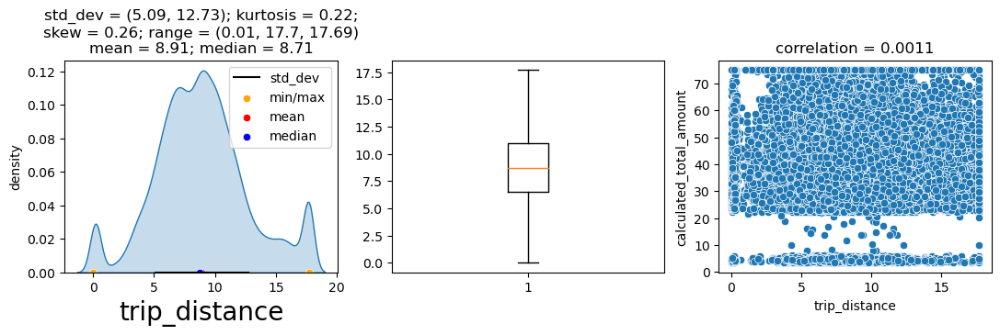

In [145]:
UVA_numeric(df, 'trip_distance', 'calculated_total_amount')

Summary:
* Trip distances mostly ranges between between 5 - 13 miles.
* Trip distance and target variable don't have much correlation between them.

#### **fare_amount**

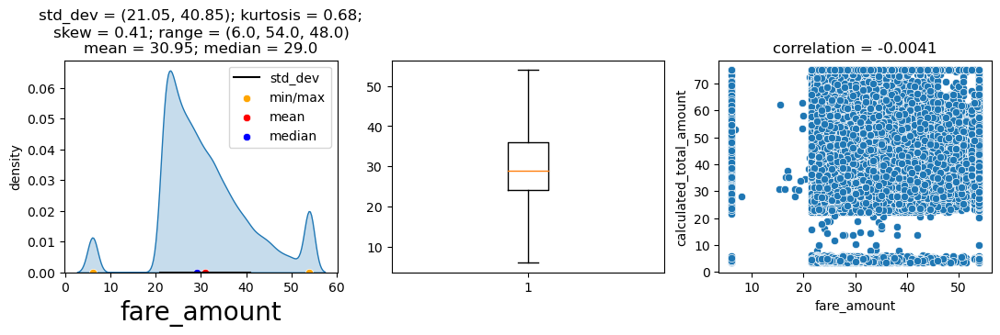

In [146]:
UVA_numeric(df, 'fare_amount', 'calculated_total_amount')

Summary:
* There are no trips with fare between $10 and $15.
* There is no proper correlation between fare and calulated_total_amount.

#### **extra**

In [147]:
df['extra'].value_counts()

0.00     25882
0.50     16322
1.00      7785
1.50         4
17.50        3
18.50        1
0.80         1
0.11         1
18.00        1
Name: extra, dtype: int64

Findings:
* Since there are only three categories 0.00, 0.50 and 1.00 dominating the feature, it can be considered as a categorical feature instead of a numeric feature and treated accordingly.

In [148]:
extra_list = [0.00,0.50,1.00]
extra_index = df[~(df['extra'].isin(extra_list))].index.to_list()
df.loc[extra_index,'extra'] =  df['extra'].map(lambda x:  np.random.choice(extra_list))
df['extra'] = df['extra'].astype('category')
df['extra'] = df['extra'].map({0.0 : 0, 0.5 : 1, 1.0: 2})
df.loc[extra_index,'extra']

2481     1
4299     2
8337     1
15115    0
23889    2
25189    1
37333    0
38491    2
38727    1
41259    1
44777    0
Name: extra, dtype: category
Categories (3, int64): [0, 1, 2]

<Figure size 700x490 with 0 Axes>

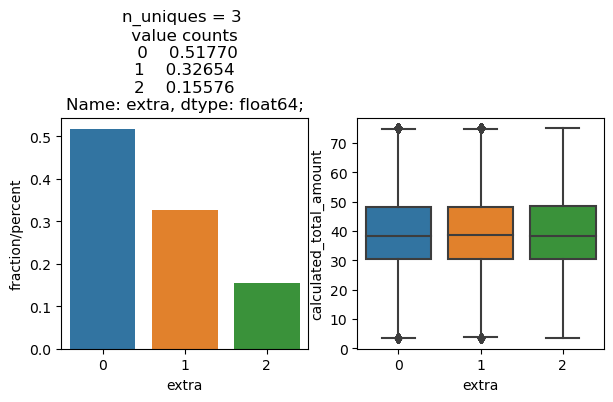

In [149]:
UVA_category(df, 'extra', 'calculated_total_amount')

Summary:
* Most of the trips are having $0 extra charges.
* Average calculated total amount is nearly equal for all extra categories.

#### **tip_amount**

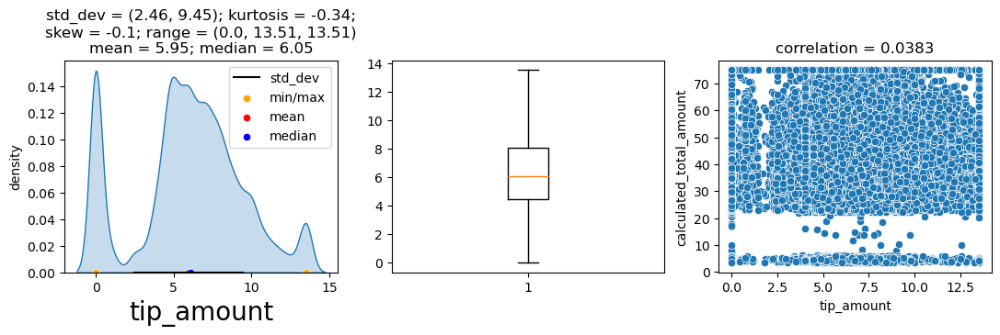

In [150]:
UVA_numeric(df, 'tip_amount', 'calculated_total_amount')

Findings:
* Lots of trips have no tips given to the driver.
* The tips that were given were mostly between $2.46 and $9.45.
* There is almost no correlation between tip_amount and calculated_total_amount.

#### **total_amount**

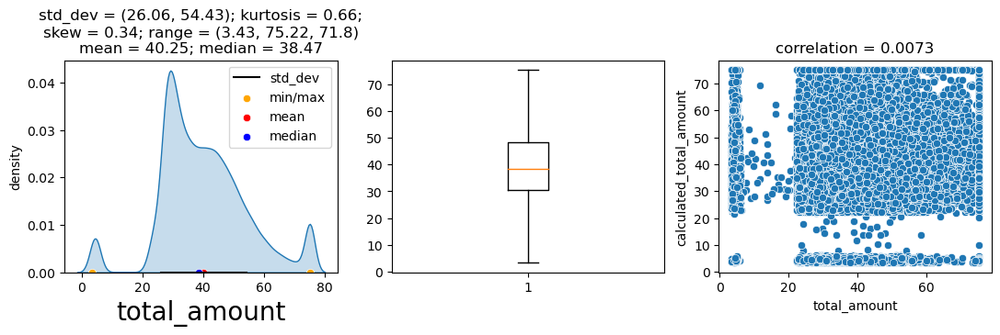

In [151]:
UVA_numeric(df, 'total_amount', 'calculated_total_amount')

Summary:
* It can be observered that for trips with total_amount ranging between $25-60, we have a lot of higher values of calculated_total_amount as well.


#### **trip_duration**

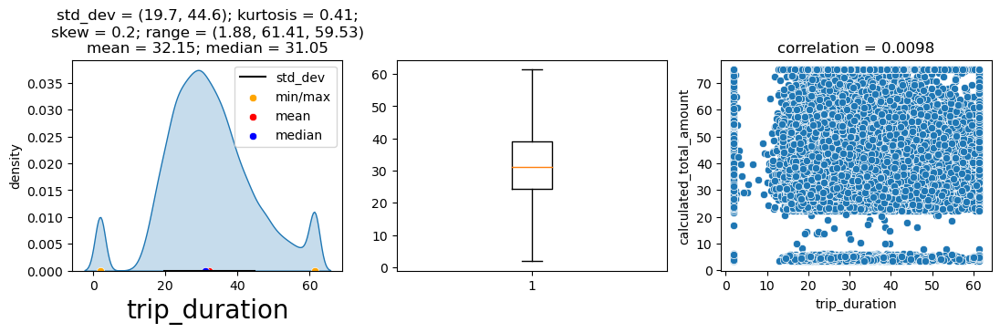

In [152]:
# Trip duration is in seconds, for better analysis it can be converted to minutes.
df['trip_duration']  =df['trip_duration']/60
UVA_numeric(df, 'trip_duration', 'calculated_total_amount')

Summary:
* Most of the trips last between 20 - 45 minutes.
* There is 0 to little correlation between trip_duration and the trips that last between 20 - 45 minutes have higher calculated_total_amount.

#### **tax_amount**

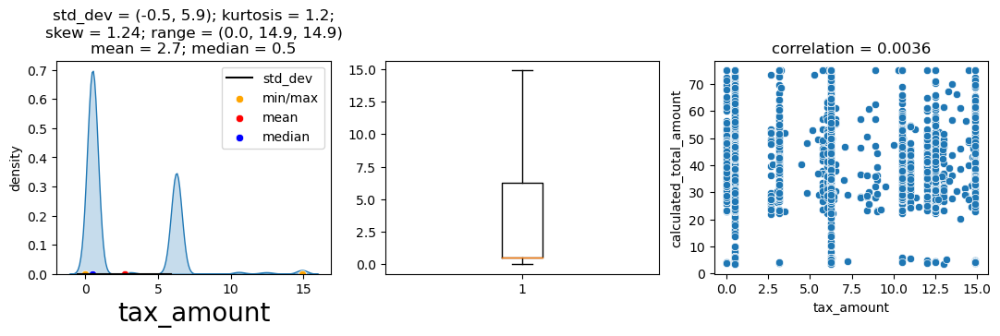

In [153]:
UVA_numeric(df, 'tax_amount', 'calculated_total_amount')

Findings: 
* Since there seems 3 categories in the feature, we can convert it to categorical feature by applying the process of binning.


<Figure size 700x490 with 0 Axes>

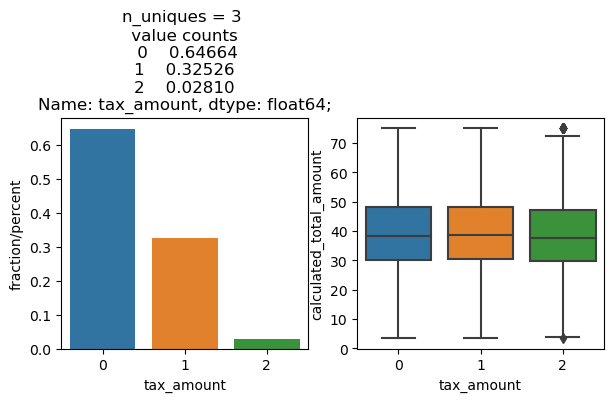

In [154]:
df['tax_amount'] = pd.qcut(df['tax_amount'], q=3, precision=1, labels=[0,1,2])
df['tax_amount'] = df['tax_amount'].astype('int64')
UVA_category(df, 'tax_amount', 'calculated_total_amount')

Summary: 
* More than 60% of the trips have very less tax_amount hence are marked as 0.
* The average calculated_amount for all the tax_amount categories are nearly same. 

<AxesSubplot:>

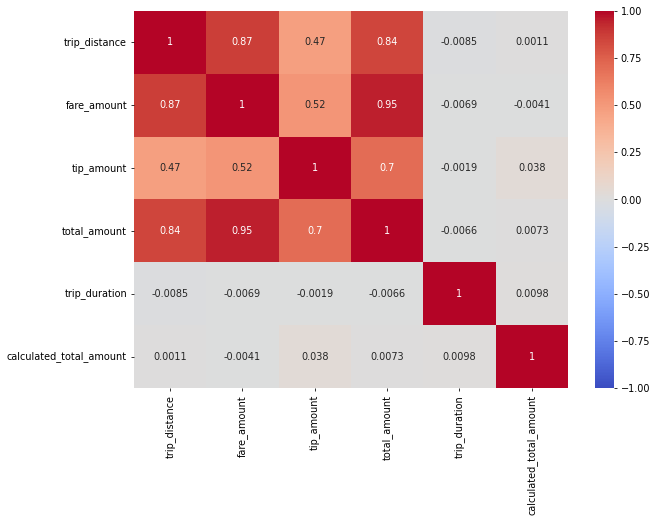

In [155]:
num_var = ['trip_distance','fare_amount', 'tip_amount', 'total_amount',
             'trip_duration','calculated_total_amount']
plt.figure(figsize = (10,7), dpi = 70)
sns.heatmap(df[num_var].corr(), annot=True, vmin = -1, vmax = 1,cmap='coolwarm')

<Figure size 700x490 with 0 Axes>

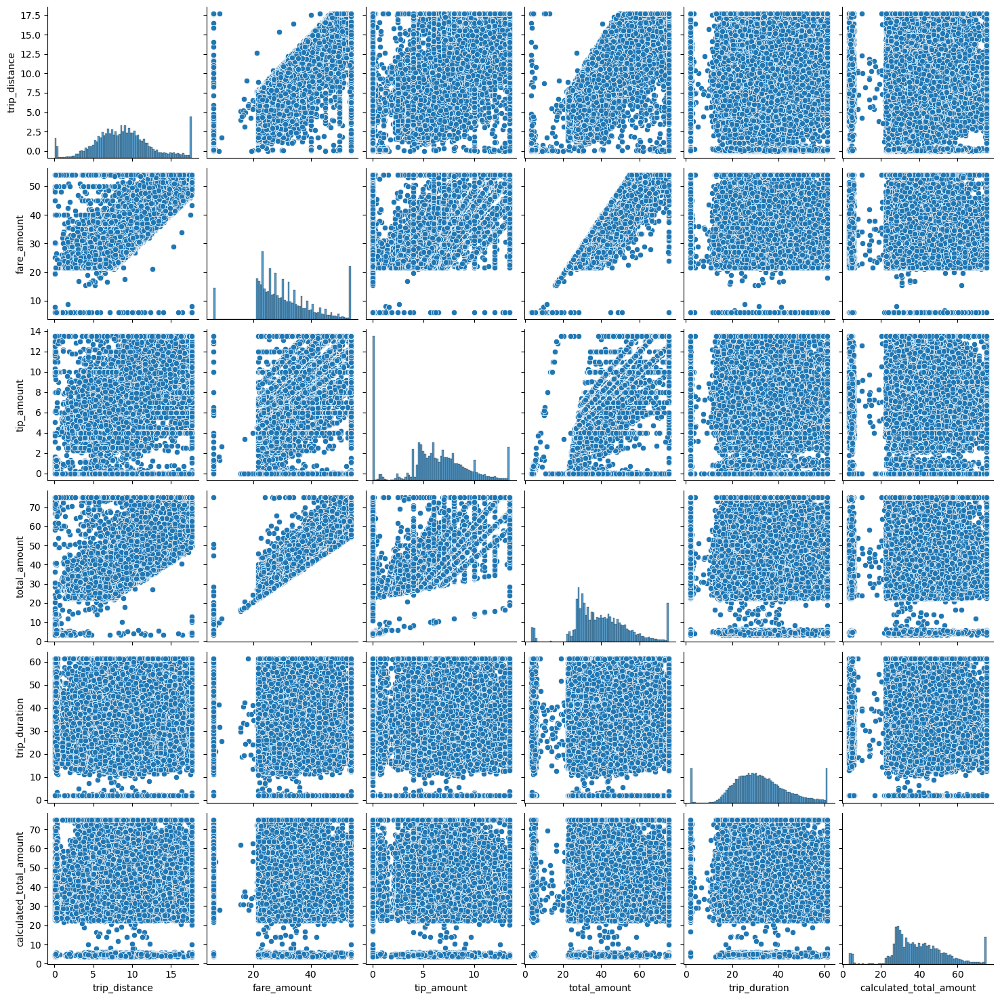

In [156]:
plt.figure(figsize = (10,7), dpi = 70)
sns.pairplot(df[num_var])

Summary:
* After observing pairplot and correlation matrix, it can be observed that trip_distance, fare_amount and total_amount are highly correlated amongst each other. Hence we can keep any one of them and remove other two.
    * trip_distance - fare_amount  = 0.87
    * trip_distance - total_amount = 0.84
    * fare_amount   - total_amount = 0.95
* We can keep total_amount and drop the other two as it is having the highest correlation(0.007) with calculated_total_amount as compared to other two.

In [157]:
df.drop(['fare_amount', 'trip_distance'], axis = 1, inplace = True)
df.head()

,rate_code,store_and_fwd_flag,payment_type,extra,tip_amount,total_amount,pickup_location_id,dropoff_location_id,month,day,day_of_week,hour_of_day,trip_duration,calculated_total_amount,tax_amount
0,1,N,1,0,8.14,40.70,262,138,3,7,2,6,35.516667,24.30,1
1,1,N,1,0,0.75,4.55,263,236,2,25,6,10,39.616667,37.40,0
2,1,N,1,0,9.61,57.67,138,230,1,29,0,8,21.433333,30.36,1
3,1,N,1,1,9.25,46.31,186,138,9,25,1,20,43.100000,4.30,1
4,1,N,1,1,4.56,27.36,162,87,8,20,0,21,26.250000,23.80,0


### **Analysis - Categorical**

In [158]:
cat_var = [ 'rate_code', 'extra' ,'store_and_fwd_flag', 'payment_type',
         'pickup_location_id','dropoff_location_id', 'tax_amount' ]

#### **rate_code**

<Figure size 700x490 with 0 Axes>

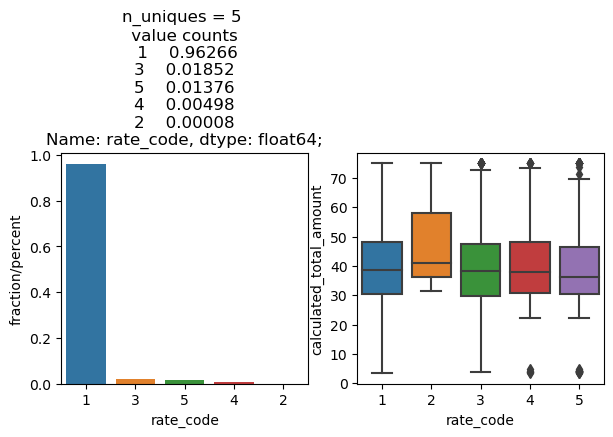

In [159]:
UVA_category(df, 'rate_code', 'calculated_total_amount')

Summary:
* Around 96% trips have Standard rates.
* Trips with JFK as rate_code have higher calculated_total_amount.

#### **store_and_fwd_flag**

<Figure size 700x490 with 0 Axes>

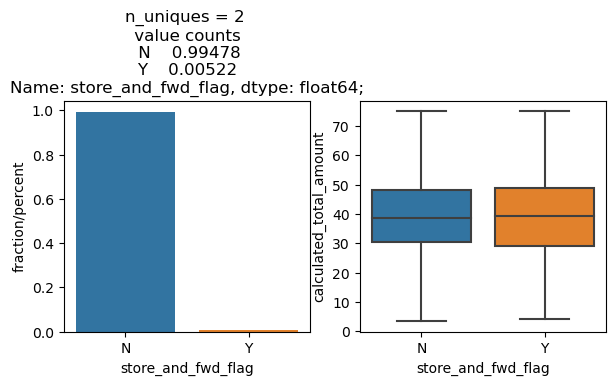

In [160]:
UVA_category(df, 'store_and_fwd_flag', 'calculated_total_amount')

Summary:
* Around 99% of trips did not store trip data in the vehicle's memory before sending it to the vendor. 

#### **payment_type**

<Figure size 700x490 with 0 Axes>

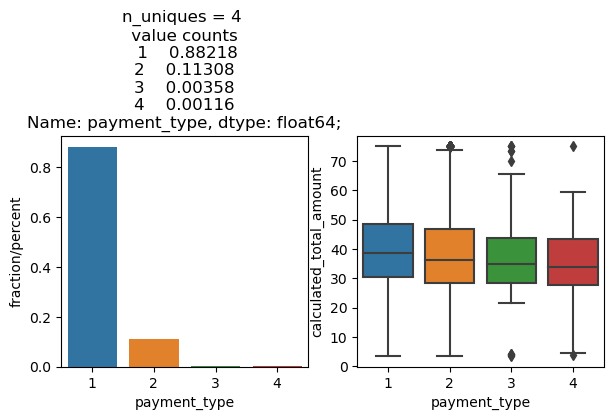

In [161]:
UVA_category(df, 'payment_type', 'calculated_total_amount')

In [162]:
payment_type_map = {
    1 : 'credit_card',
    2 : 'cash',
    3 : 'others',
    4 : 'others'
}
df['payment_type'] = df['payment_type'].map(payment_type_map)
df['payment_type'].value_counts()

credit_card    44109
cash            5654
others           237
Name: payment_type, dtype: int64

Summary:
* Around 88% of the trips had were paid using credit card, while around 11% of the trips were paid using cash.
* A new category 'others' was introduced which combined payment_type dispute and unknown.

#### **pickup_location_id & dropoff_location_id**

In [163]:
# Since there are too many categories in location_id columns it is better to drop them.
df = df.drop(['pickup_location_id', 'dropoff_location_id'], axis = 1)

### **Analysis - DateTime**

In [164]:
date_var = ['month', 'day','day_of_week', 'hour_of_day']

#### **month**

<Figure size 700x490 with 0 Axes>

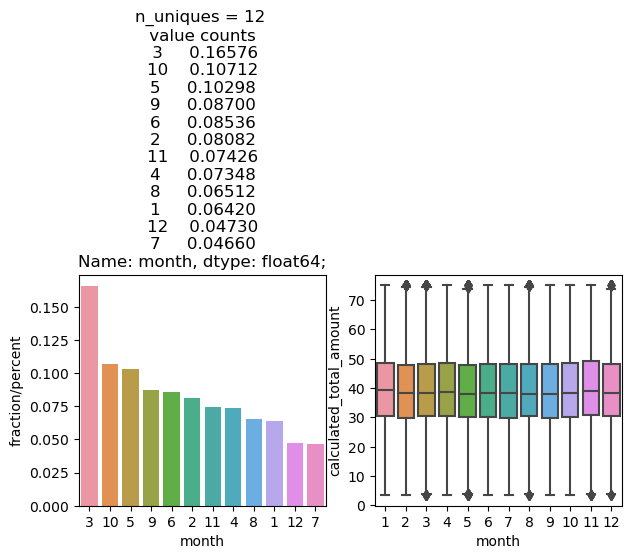

In [165]:
UVA_category(df, 'month', 'calculated_total_amount')

#### **day**

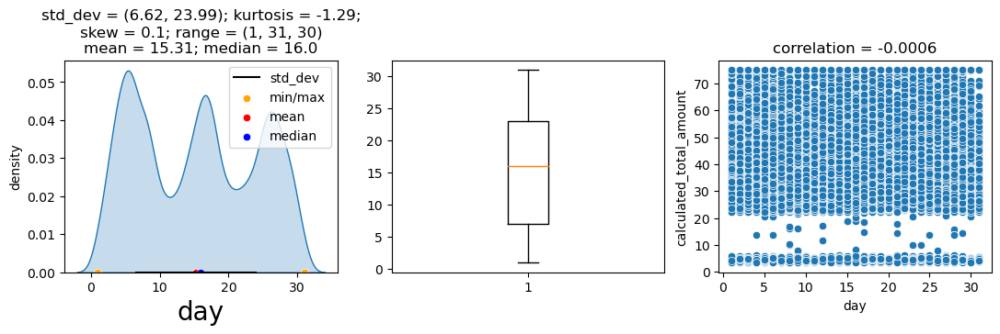

In [166]:
UVA_numeric(df, 'day', 'calculated_total_amount')

#### **day_of_week**

<Figure size 700x490 with 0 Axes>

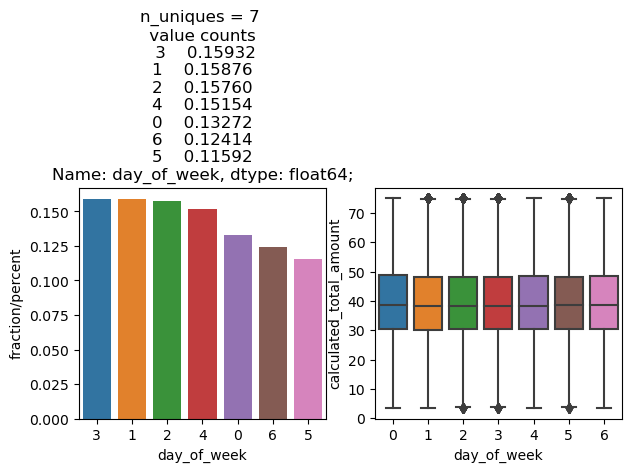

In [167]:
UVA_category(df, 'day_of_week', 'calculated_total_amount')

Summary:
* Higher number of trips can be observed in the middle of the week.
* On weekends, least number of trips were observed. This may be due to the fact that most people take cabs to their offices.

#### **hour_of_day**

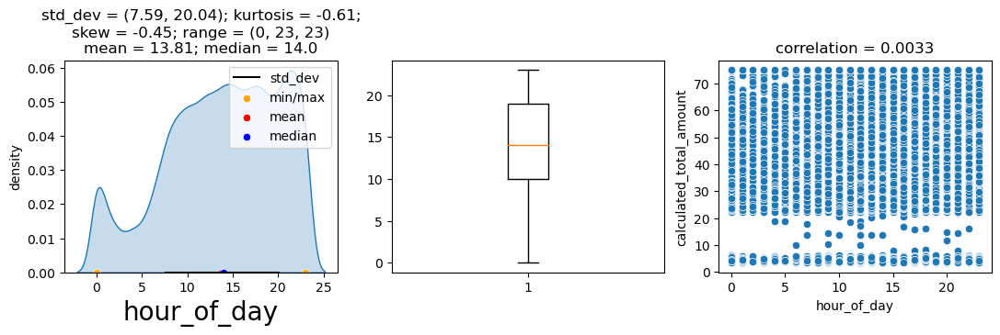

In [168]:
UVA_numeric(df, 'hour_of_day', 'calculated_total_amount')

Summary:
* Least amount of trips were taken after midnight and before 6 am.

In [169]:
df['rush_hour'] = df['hour_of_day'].apply(lambda x: 1 if x in [7,8,9,10,17,18,19] else 0)
df.drop('hour_of_day', axis = True, inplace = True)

#### **Creating categorical dummy variables**

In [170]:
df = pd.get_dummies(df, columns = [ 'rate_code', 'extra' ,'store_and_fwd_flag', 'payment_type','rush_hour'], drop_first= True )

#### **Train Test Split**

In [171]:
df.shape

(50000, 18)

In [172]:
scaler = StandardScaler()
df[['tip_amount', 'total_amount', 'trip_duration']] = scaler.fit_transform(df[['tip_amount', 'total_amount', 'trip_duration']])
df.head()


,tip_amount,total_amount,month,day,day_of_week,trip_duration,calculated_total_amount,tax_amount,rate_code_2,rate_code_3,rate_code_4,rate_code_5,extra_1,extra_2,store_and_fwd_flag_Y,payment_type_credit_card,payment_type_others,rush_hour_1
0,0.626195,0.031979,3,7,2,0.270619,24.30,1,0,0,0,0,0,0,0,1,0,0
1,-1.487838,-2.516954,2,25,6,0.600022,37.40,0,0,0,0,0,0,0,0,1,0,1
2,1.046713,1.228531,1,29,0,-0.860868,30.36,1,0,0,0,0,0,0,0,1,0,1
3,0.943729,0.427539,9,25,1,0.879880,4.30,1,0,0,0,0,1,0,0,1,0,0
4,-0.397924,-0.908623,8,20,0,-0.473886,23.80,0,0,0,0,0,1,0,0,1,0,0


In [173]:
train_df = df[~(df['calculated_total_amount'].isna())] 
test_df = df[df['calculated_total_amount'].isna()]
test_df.drop('calculated_total_amount', axis = 1, inplace = True)
train_df.shape, test_df.shape 

((35000, 18), (15000, 17))

In [174]:
X = train_df.drop('calculated_total_amount', axis = 1)
y = train_df['calculated_total_amount']

In [175]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=100)
X_train.shape[0], X_test.shape[0]

(28000, 7000)

## **Model Building**

The following models will be trained:
1. Linear Regression
2. Ridge Regression
3. Lasso Regression
4. Elastic Net Regression
5. Bagging Ensemble  
    * Random Forest Regressor
6. Boosting Emsemble 
    * AdaBoost Regressor
    * GradientBoost Regressor
    * XGBoost Regressor

**Note: ** RMSE will be considered as the accuracy metric. The model with lowest RMSE score will be choosen and hyperparameter tunning will be performed.

In [176]:
model_dict = {
    'Linear Regression' : LinearRegression(),
    'Ridge' : Ridge(),
    'Lasso': Lasso(),
    'ElasticNet': ElasticNet(),
    'Random Forest' : RandomForestRegressor(),
    'Adaboost' : AdaBoostRegressor(),
    'GradientBoost' : GradientBoostingRegressor(),
    'XGBoost' : XGBRegressor()
}

In [177]:
model_score = pd.DataFrame()
for model in model_dict:
    curr_model = model_dict[model]
    curr_model.fit(X_train, y_train)
    y_pred = curr_model.predict(X_test)
    model_score = model_score.append({'Model' : model,
                                                'R2' : round(r2_score(y_test, y_pred),3),
                                                'RMSE' : round(np.sqrt(mse(y_test, y_pred)),3)
                                                }, ignore_index=True)
model_score

,Model,R2,RMSE
0,Linear Regression,0.004,14.311
1,Ridge,0.004,14.311
2,Lasso,-0.000,14.339
3,ElasticNet,0.000,14.339
4,Random Forest,-0.057,14.745
5,Adaboost,0.002,14.327
6,GradientBoost,0.007,14.288
7,XGBoost,-0.045,14.661


In [178]:
min_rmse = min(model_score['RMSE'])
best_model = model_score[model_score['RMSE'] == min_rmse]['Model'].values[0]
print('Best model comes out to be {} with RMSE: {}'.format(best_model,min_rmse))
print('It will be selected for HyperParameter tuning.')

Best model comes out to be GradientBoost with RMSE: 14.288
It will be selected for HyperParameter tuning.


#### **HyperParameter Tuning**

In [69]:
# Custom scoring function to be used in GridSearchCV
def rmse(actual, prediction):
    return np.sqrt(mse(actual, prediction))

rmse_score = make_scorer(score_func= rmse, greater_is_better= False)

In [79]:
model_params = {
    'Linear Regression' : {},
    'Random Forest' : {
        #random forest Parameters
        'n_estimators' : [50,75,100],
        'max_samples' : [.25,.5,.75],
        'max_features' : ['sqrt', 'log2'],

        #Base Estimator(DT) Parameters
        'criterion' : ['gini', 'entropy'],
        'max_depth' : [5,7,9,11],
        'min_samples_split' : [15, 20, 25],
        'min_samples_leaf' : [15, 20, 25]
    },
    'Adaboost' : {
        'n_estimators' : [50, 75, 100, 125, 150],
        'learning_rate' : [0.001, 0.01, 0.05, 0.1, 1,5],
        'algorithm' : ['SAMME', 'SAMME.R']
    },
    'GradientBoost' : {
        'learning_rate' : [0.01,0.1,0.5],
        'n_estimators' : [75, 100, 125],
        'min_samples_split' : [15,30,50],
        'min_samples_leaf' : [5,10,15,20],
        'max_depth' : [5,7,10],
        'min_impurity_decrease': [0.1, 0.3],
        'max_features': ['sqrt', 'log2'],
        'verbose' : [1]
    }
}

In [80]:
best_model_grid_search = GridSearchCV(model_dict[best_model], model_params[best_model], cv = 5, scoring = rmse_score)
best_model_grid_search.fit(X_train, y_train)

print('Best Hyper Parameters for {}: \n{}'.format(best_model, best_model_grid_search.best_params_))
print('Best score for {} using above Hyper Parameters: {}'.format(best_model, best_model_grid_search.best_score_))

      Iter       Train Loss   Remaining Time 
         1         199.6316            0.38s
         2         199.6075            0.41s
         3         199.5819            0.65s
         4         199.5478            0.62s
         5         199.5258            0.60s
         6         199.4964            0.68s
         7         199.4665            0.65s
         8         199.4372            0.63s
         9         199.4080            0.67s
        10         199.3820            0.59s
        20         199.1112            0.45s
        30         198.8594            0.37s
        40         198.6339            0.29s
        50         198.4408            0.21s
        60         198.2388            0.13s
        70         198.0377            0.04s
      Iter       Train Loss   Remaining Time 
         1         199.8249            0.00s
         2         199.8035            0.58s
         3         199.7772            0.58s
         4         199.7466            0.57s
        

In [81]:
model_dict_revised = {
    'Linear Regression' : LinearRegression,
    'Ridge' : Ridge,
    'Lasso': Lasso,
    'ElasticNet': ElasticNet,
    'Random Forest' : RandomForestRegressor,
    'Adaboost' : AdaBoostRegressor,
    'GradientBoost' : GradientBoostingRegressor,
    'XGBoost' : XGBRegressor
}

In [83]:
_best_model = model_dict_revised[best_model](**best_model_grid_search.best_params_)
_best_model.fit(X_train, y_train)
y_pred_1 = _best_model.predict(X_test)
print('Hyperpamater tunned {} RMSE on validation dataset: {}'.format(best_model, np.sqrt(mse(y_test, y_pred_1))))

      Iter       Train Loss   Remaining Time 
         1         199.9361            1.68s
         2         199.8975            1.48s
         3         199.8420            1.53s
         4         199.7989            1.62s
         5         199.7604            1.48s
         6         199.7155            1.54s
         7         199.6750            1.44s
         8         199.6343            1.49s
         9         199.5972            1.52s
        10         199.5552            1.54s
        20         199.1881            1.44s
        30         198.8545            1.29s
        40         198.5050            1.14s
        50         198.2014            1.01s
        60         197.9091            0.88s
        70         197.6294            0.75s
        80         197.3431            0.63s
        90         197.0697            0.50s
       100         196.8354            0.35s
Hyperpamater tunned GradientBoost RMSE on validation dataset: 14.296834210080485


In [88]:
y_pred_1 = _best_model.predict(test_df)
submission_df = pd.DataFrame(y_pred_1, columns = ['calculated_total_amount'])
submission_df.to_csv('my_submission_file.csv', index=False)